# Giga Recurrent Unbounded Network ➿

In [1]:
import torch
from torch.utils.data import DataLoader, Dataset, SequentialSampler, RandomSampler
import pandas as pd
import numpy as np
from sklearn.preprocessing import Normalizer, MinMaxScaler
import wandb
from IPython.display import Markdown

## Data Preprocessing & Loading

In [1]:
%run ./Modules/DataPreprocessing.ipynb

### Training Dataframe

,INV01_CurrentDC(A),INV01_CurrentAC(A),INV01_TotalEnergy(kWh),INV01_PowerAC(kW),INV01_PowerDC(kW),INV01_InternalTemperature(C),INV01_HeatSinkTemperature(C),INV01_VoltageDC(V),INV01_VoltageAC(V),INV02_CurrentDC(A),...,rain (mm),cloudcover (%),soil_temperature_7_to_28cm (°C),soil_moisture_7_to_28cm (m³/m³),minute_sin,minute_cos,day_sin,day_cos,target,isday
timestamp,,,,,,,,,,,,,,,,,,,,,
2022-06-01 00:00:00,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.066667,0.377522,0.135593,0.788675,0.788675,0.567186,0.826064,0.0,0.0
2022-06-01 00:15:00,0.0,0.0,0.154618,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.100000,0.719020,0.362712,1.000000,0.211325,0.600779,0.989739,0.0,0.0
2022-06-01 00:30:00,0.0,0.0,0.154618,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.100000,0.719020,0.362712,0.211325,0.000000,0.600779,0.989739,0.0,0.0
2022-06-01 00:45:00,0.0,0.0,0.154618,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.100000,0.719020,0.362712,0.000000,0.788675,0.600779,0.989739,0.0,0.0
2022-06-01 01:00:00,0.0,0.0,0.154618,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.113333,0.713256,0.362712,0.788675,1.000000,0.600779,0.989739,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-31 22:45:00,0.0,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.550000,0.221902,0.718644,0.000000,0.788675,0.500000,1.000000,0.0,0.0
2022-12-31 23:00:00,0.0,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.183333,0.213256,0.718644,0.788675,1.000000,0.500000,1.000000,0.0,0.0
2022-12-31 23:15:00,0.0,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.208934,0.718644,1.000000,0.211325,0.500000,1.000000,0.0,0.0


### Validation Dataframe

,INV01_CurrentDC(A),INV01_CurrentAC(A),INV01_TotalEnergy(kWh),INV01_PowerAC(kW),INV01_PowerDC(kW),INV01_InternalTemperature(C),INV01_HeatSinkTemperature(C),INV01_VoltageDC(V),INV01_VoltageAC(V),INV02_CurrentDC(A),...,rain (mm),cloudcover (%),soil_temperature_7_to_28cm (°C),soil_moisture_7_to_28cm (m³/m³),minute_sin,minute_cos,day_sin,day_cos,target,isday
timestamp,,,,,,,,,,,,,,,,,,,,,
2023-01-01 00:00:00,0.0,0.0,0.563588,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.037464,0.372881,0.788675,0.788675,0.567186,0.826064,0.0,0.0
2023-01-01 00:15:00,0.0,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.208934,0.718644,1.000000,0.211325,0.600779,0.989739,0.0,0.0
2023-01-01 00:30:00,0.0,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.208934,0.718644,0.211325,0.000000,0.600779,0.989739,0.0,0.0
2023-01-01 00:45:00,0.0,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.208934,0.718644,0.000000,0.788675,0.600779,0.989739,0.0,0.0
2023-01-01 01:00:00,0.0,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.206052,0.718644,0.788675,1.000000,0.600779,0.989739,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-01-31 22:45:00,0.0,0.0,1.065661,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.340000,0.109510,0.945763,0.000000,0.788675,0.500000,1.000000,0.0,0.0
2023-01-31 23:00:00,0.0,0.0,1.065661,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.406667,0.106628,0.945763,0.788675,1.000000,0.500000,1.000000,0.0,0.0
2023-01-31 23:15:00,0.0,0.0,1.065661,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.440000,0.105187,0.945763,1.000000,0.211325,0.500000,1.000000,0.0,0.0


### Testing Dataframe

,INV01_CurrentDC(A),INV01_CurrentAC(A),INV01_TotalEnergy(kWh),INV01_PowerAC(kW),INV01_PowerDC(kW),INV01_InternalTemperature(C),INV01_HeatSinkTemperature(C),INV01_VoltageDC(V),INV01_VoltageAC(V),INV02_CurrentDC(A),...,rain (mm),cloudcover (%),soil_temperature_7_to_28cm (°C),soil_moisture_7_to_28cm (m³/m³),minute_sin,minute_cos,day_sin,day_cos,target,isday
timestamp,,,,,,,,,,,,,,,,,,,,,
2023-02-01 00:00:00,0.000000,0.000000,0.607363,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.0,...,0.000000,0.293333,-0.031700,0.524294,0.788675,0.788675,0.567186,0.826064,0.0,0.0
2023-02-01 00:15:00,0.000000,0.000000,1.065661,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.0,...,0.000000,0.440000,0.105187,0.945763,1.000000,0.211325,0.600779,0.989739,0.0,0.0
2023-02-01 00:30:00,0.000000,0.000000,1.065661,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.0,...,0.000000,0.440000,0.105187,0.945763,0.211325,0.000000,0.600779,0.989739,0.0,0.0
2023-02-01 00:45:00,0.000000,0.000000,1.065661,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.0,...,0.000000,0.440000,0.105187,0.945763,0.000000,0.788675,0.600779,0.989739,0.0,0.0
2023-02-01 01:00:00,0.000000,0.000000,1.065661,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.0,...,0.000000,0.480000,0.105187,0.943503,0.788675,1.000000,0.600779,0.989739,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-02-28 22:45:00,0.321166,0.411974,1.161360,0.409118,0.415037,0.217311,0.585633,0.83682,0.96819,0.0,...,0.021277,1.000000,0.230548,0.705085,0.000000,0.788675,0.213999,0.910151,0.0,0.0
2023-02-28 23:00:00,0.321166,0.411974,1.161360,0.409118,0.415037,0.217311,0.585633,0.83682,0.96819,0.0,...,0.007092,1.000000,0.227666,0.705085,0.788675,1.000000,0.213999,0.910151,0.0,0.0
2023-02-28 23:15:00,0.321166,0.411974,1.161360,0.409118,0.415037,0.217311,0.585633,0.83682,0.96819,0.0,...,0.000000,1.000000,0.226225,0.705085,1.000000,0.211325,0.213999,0.910151,0.0,0.0


In [2]:
class CustomDataset(Dataset):
    MAX_DAYS = 4
    MIN_DAYS = 1
    DAY_IN_TIMESTAMPS = 96 # 15 min

    def __init__(self, df, batch_size):
        self.df = df
        self.batch_size = batch_size
        self.counter = 0
        self.target_len = -1
    
    def __len__(self):
        return int(len(self.df)/self.DAY_IN_TIMESTAMPS)-2 - self.MAX_DAYS
    
    def __getitem__(self, idx):
        if self.counter == self.batch_size:
            self.counter = 0
        
        if self.counter == 0:
            self.target_len = np.random.randint(1, self.MAX_DAYS+1)
        
        tmp_df = self.df.iloc[0+(self.DAY_IN_TIMESTAMPS*(idx+1)) - self.DAY_IN_TIMESTAMPS : (self.DAY_IN_TIMESTAMPS*(idx+1))+(self.DAY_IN_TIMESTAMPS*self.target_len) + self.DAY_IN_TIMESTAMPS]
        timestamps = tmp_df.index
        #timestamps = tmp_df['timestamp']
        #tmp_df = tmp_df.drop(columns=['timestamp'])

        mask_before = np.array([1]*self.DAY_IN_TIMESTAMPS + [0]*(len(tmp_df) - self.DAY_IN_TIMESTAMPS))
        mask_after = np.array([0] * (len(tmp_df) - self.DAY_IN_TIMESTAMPS) + [1]*self.DAY_IN_TIMESTAMPS)
        mask_target = np.array([0]*self.DAY_IN_TIMESTAMPS + [1] * (len(tmp_df) - self.DAY_IN_TIMESTAMPS*2) +[0] * self.DAY_IN_TIMESTAMPS)
        
        # print(len(mask_target), f"{timestamps[0]}-{timestamps[-1]}")
        
        before = tmp_df[mask_before == 1]
        target = tmp_df[mask_target == 1]
        after  = tmp_df[mask_after == 1]
        
        before = before[[
            'Impianto_SolargisGHI(W/m2)','Impianto_SolargisGTI(W/m2)', 
            'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'minute_sin', 'minute_cos', 'day_sin', 'day_cos',
            'temperature_2m (°C)', 'relativehumidity_2m (%)', 'dewpoint_2m (°C)', 
            'rain (mm)', 'cloudcover (%)', 'soil_temperature_7_to_28cm (°C)', 'soil_moisture_7_to_28cm (m³/m³)',
            'isday',
            'target'
            #'Cont_TotalEnergy(kWh)'
        ]]
        
        future = target.copy()
        future = future[[
            'Impianto_SolargisGHI(W/m2)','Impianto_SolargisGTI(W/m2)', 
            'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'minute_sin', 'minute_cos', 'day_sin', 'day_cos',
            'temperature_2m (°C)', 'relativehumidity_2m (%)', 'dewpoint_2m (°C)', 
            'rain (mm)', 'cloudcover (%)', 'soil_temperature_7_to_28cm (°C)', 'soil_moisture_7_to_28cm (m³/m³)',
            'isday',
        ]]
        
        after = after[[
            'Impianto_SolargisGHI(W/m2)','Impianto_SolargisGTI(W/m2)', 
            'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'minute_sin', 'minute_cos', 'day_sin', 'day_cos',
            'temperature_2m (°C)', 'relativehumidity_2m (%)', 'dewpoint_2m (°C)', 
            'rain (mm)', 'cloudcover (%)', 'soil_temperature_7_to_28cm (°C)', 'soil_moisture_7_to_28cm (m³/m³)',
            'isday',
            'target'
            #'Cont_TotalEnergy(kWh)'
        ]]
        
        tsolargis = target[['Impianto_SolargisGHI(W/m2)','Impianto_SolargisGTI(W/m2)']].copy()
        tsolargis.columns = ['GHI', 'GTI']
        
        target = target['target']
        
        self.counter += 1
        
        #print(mask_before)
        #print(mask_target)
        #print(mask_after)
        
        return before, target, future, after, mask_before, mask_target, mask_after, timestamps, tsolargis
    
    def reset(self):
        self.counter = 0

### Tests

In [3]:
train_dataset = CustomDataset(train_df, BATCH_SIZE)

In [4]:
len(train_dataset)

208

In [5]:
b, t, f, a, mask_b, mask_t, mask_a, timestamps, _ = train_dataset[0]

print(len(mask_b), len(mask_t), len(mask_a))

display(Markdown("### Before"))
display(b)
display(Markdown("### Target"))
display(t)
display(Markdown("### Future"))
display(f)
display(Markdown("### After"))
display(a)
display(Markdown("### Timestamps"))
display(timestamps)


288 288 288


### Before

,Impianto_SolargisGHI(W/m2),Impianto_SolargisGTI(W/m2),month_sin,month_cos,hour_sin,hour_cos,minute_sin,minute_cos,day_sin,day_cos,temperature_2m (°C),relativehumidity_2m (%),dewpoint_2m (°C),rain (mm),cloudcover (%),soil_temperature_7_to_28cm (°C),soil_moisture_7_to_28cm (m³/m³),isday,target
timestamp,,,,,,,,,,,,,,,,,,,
2022-06-01 00:00:00,0.0,0.0,1.0,0.166667,0.50000,0.833333,0.788675,0.788675,0.567186,0.826064,0.300000,0.390476,0.465517,0.0,0.066667,0.377522,0.135593,0.0,0.0
2022-06-01 00:15:00,0.0,0.0,1.0,0.000000,0.50000,1.000000,1.000000,0.211325,0.600779,0.989739,0.520000,0.800000,0.715517,0.0,0.100000,0.719020,0.362712,0.0,0.0
2022-06-01 00:30:00,0.0,0.0,1.0,0.000000,0.50000,1.000000,0.211325,0.000000,0.600779,0.989739,0.520000,0.800000,0.715517,0.0,0.100000,0.719020,0.362712,0.0,0.0
2022-06-01 00:45:00,0.0,0.0,1.0,0.000000,0.50000,1.000000,0.000000,0.788675,0.600779,0.989739,0.520000,0.800000,0.715517,0.0,0.100000,0.719020,0.362712,0.0,0.0
2022-06-01 01:00:00,0.0,0.0,1.0,0.000000,0.62941,0.982963,0.788675,1.000000,0.600779,0.989739,0.504444,0.838095,0.715517,0.0,0.113333,0.713256,0.362712,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-01 22:45:00,0.0,0.0,1.0,0.000000,0.25000,0.933013,0.000000,0.788675,0.600779,0.989739,0.533333,0.814286,0.741379,0.0,0.000000,0.719020,0.352542,0.0,0.0
2022-06-01 23:00:00,0.0,0.0,1.0,0.000000,0.37059,0.982963,0.788675,1.000000,0.600779,0.989739,0.526667,0.766667,0.706897,0.0,0.000000,0.707493,0.352542,0.0,0.0
2022-06-01 23:15:00,0.0,0.0,1.0,0.000000,0.37059,0.982963,1.000000,0.211325,0.600779,0.989739,0.523333,0.742857,0.689655,0.0,0.000000,0.701729,0.352542,0.0,0.0


### Target

timestamp
2022-06-02 00:00:00    0.0
2022-06-02 00:15:00    0.0
2022-06-02 00:30:00    0.0
2022-06-02 00:45:00    0.0
2022-06-02 01:00:00    0.0
                      ... 
2022-06-02 22:45:00    0.0
2022-06-02 23:00:00    0.0
2022-06-02 23:15:00    0.0
2022-06-02 23:30:00    0.0
2022-06-02 23:45:00    0.0
Freq: 15T, Name: target, Length: 96, dtype: float64

### Future

,Impianto_SolargisGHI(W/m2),Impianto_SolargisGTI(W/m2),month_sin,month_cos,hour_sin,hour_cos,minute_sin,minute_cos,day_sin,day_cos,temperature_2m (°C),relativehumidity_2m (%),dewpoint_2m (°C),rain (mm),cloudcover (%),soil_temperature_7_to_28cm (°C),soil_moisture_7_to_28cm (m³/m³),isday
timestamp,,,,,,,,,,,,,,,,,,
2022-06-02 00:00:00,0.0,0.0,1.0,0.166667,0.50000,0.833333,0.788675,0.788675,0.631621,0.805821,0.302222,0.352381,0.448276,0.0,0.000000,0.365994,0.128814,0.0
2022-06-02 00:15:00,0.0,0.0,1.0,0.000000,0.50000,1.000000,1.000000,0.211325,0.697431,0.959375,0.523333,0.742857,0.689655,0.0,0.000000,0.701729,0.352542,0.0
2022-06-02 00:30:00,0.0,0.0,1.0,0.000000,0.50000,1.000000,0.211325,0.000000,0.697431,0.959375,0.523333,0.742857,0.689655,0.0,0.000000,0.701729,0.352542,0.0
2022-06-02 00:45:00,0.0,0.0,1.0,0.000000,0.50000,1.000000,0.000000,0.788675,0.697431,0.959375,0.523333,0.742857,0.689655,0.0,0.000000,0.701729,0.352542,0.0
2022-06-02 01:00:00,0.0,0.0,1.0,0.000000,0.62941,0.982963,0.788675,1.000000,0.697431,0.959375,0.532222,0.714286,0.681034,0.0,0.000000,0.695965,0.354802,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-02 22:45:00,0.0,0.0,1.0,0.000000,0.25000,0.933013,0.000000,0.788675,0.697431,0.959375,0.630000,0.385714,0.581897,0.0,0.010000,0.740634,0.345763,0.0
2022-06-02 23:00:00,0.0,0.0,1.0,0.000000,0.37059,0.982963,0.788675,1.000000,0.697431,0.959375,0.583333,0.461905,0.579023,0.0,0.003333,0.731988,0.345763,0.0
2022-06-02 23:15:00,0.0,0.0,1.0,0.000000,0.37059,0.982963,1.000000,0.211325,0.697431,0.959375,0.560000,0.500000,0.577586,0.0,0.000000,0.727666,0.345763,0.0


### After

,Impianto_SolargisGHI(W/m2),Impianto_SolargisGTI(W/m2),month_sin,month_cos,hour_sin,hour_cos,minute_sin,minute_cos,day_sin,day_cos,temperature_2m (°C),relativehumidity_2m (%),dewpoint_2m (°C),rain (mm),cloudcover (%),soil_temperature_7_to_28cm (°C),soil_moisture_7_to_28cm (m³/m³),isday,target
timestamp,,,,,,,,,,,,,,,,,,,
2022-06-03 00:00:00,0.0,0.0,1.0,0.166667,0.50000,0.833333,0.788675,0.788675,0.690667,0.773005,0.326667,0.190476,0.373563,0.0,0.000000,0.383285,0.124294,0.0,0.0
2022-06-03 00:15:00,0.0,0.0,1.0,0.000000,0.50000,1.000000,1.000000,0.211325,0.786001,0.910151,0.560000,0.500000,0.577586,0.0,0.000000,0.727666,0.345763,0.0,0.0
2022-06-03 00:30:00,0.0,0.0,1.0,0.000000,0.50000,1.000000,0.211325,0.000000,0.786001,0.910151,0.560000,0.500000,0.577586,0.0,0.000000,0.727666,0.345763,0.0,0.0
2022-06-03 00:45:00,0.0,0.0,1.0,0.000000,0.50000,1.000000,0.000000,0.788675,0.786001,0.910151,0.560000,0.500000,0.577586,0.0,0.000000,0.727666,0.345763,0.0,0.0
2022-06-03 01:00:00,0.0,0.0,1.0,0.000000,0.62941,0.982963,0.788675,1.000000,0.786001,0.910151,0.551111,0.500000,0.566092,0.0,0.000000,0.721902,0.345763,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-03 22:45:00,0.0,0.0,1.0,0.000000,0.25000,0.933013,0.000000,0.788675,0.786001,0.910151,0.660000,0.357143,0.581897,0.0,0.280000,0.766571,0.335593,0.0,0.0
2022-06-03 23:00:00,0.0,0.0,1.0,0.000000,0.37059,0.982963,0.788675,1.000000,0.786001,0.910151,0.613333,0.404762,0.567529,0.0,0.273333,0.755043,0.335593,0.0,0.0
2022-06-03 23:15:00,0.0,0.0,1.0,0.000000,0.37059,0.982963,1.000000,0.211325,0.786001,0.910151,0.590000,0.428571,0.560345,0.0,0.270000,0.749280,0.335593,0.0,0.0


### Timestamps

DatetimeIndex(['2022-06-01 00:00:00', '2022-06-01 00:15:00',
               '2022-06-01 00:30:00', '2022-06-01 00:45:00',
               '2022-06-01 01:00:00', '2022-06-01 01:15:00',
               '2022-06-01 01:30:00', '2022-06-01 01:45:00',
               '2022-06-01 02:00:00', '2022-06-01 02:15:00',
               ...
               '2022-06-03 21:30:00', '2022-06-03 21:45:00',
               '2022-06-03 22:00:00', '2022-06-03 22:15:00',
               '2022-06-03 22:30:00', '2022-06-03 22:45:00',
               '2022-06-03 23:00:00', '2022-06-03 23:15:00',
               '2022-06-03 23:30:00', '2022-06-03 23:45:00'],
              dtype='datetime64[ns]', name='timestamp', length=288, freq='15T')

In [11]:
train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, collate_fn=collate_fn, shuffle=True)

In [14]:
for b_before, b_target, b_future, b_after, b_m_b, b_m_t, b_m_a, b_timestamps in train_dataloader:
    print(b_before.shape, b_target.shape, b_future.shape, b_after.shape)
train_dataset.reset()

torch.Size([10, 287, 47]) torch.Size([10, 1148, 1]) torch.Size([10, 1148, 17]) torch.Size([10, 287, 47])
torch.Size([10, 287, 47]) torch.Size([10, 287, 1]) torch.Size([10, 287, 17]) torch.Size([10, 287, 47])
torch.Size([10, 287, 47]) torch.Size([10, 1148, 1]) torch.Size([10, 1148, 17]) torch.Size([10, 287, 47])
torch.Size([10, 287, 47]) torch.Size([10, 1148, 1]) torch.Size([10, 1148, 17]) torch.Size([10, 287, 47])
torch.Size([10, 287, 47]) torch.Size([10, 1148, 1]) torch.Size([10, 1148, 17]) torch.Size([10, 287, 47])
torch.Size([10, 287, 47]) torch.Size([10, 287, 1]) torch.Size([10, 287, 17]) torch.Size([10, 287, 47])
torch.Size([10, 287, 47]) torch.Size([10, 287, 1]) torch.Size([10, 287, 17]) torch.Size([10, 287, 47])
torch.Size([10, 287, 47]) torch.Size([10, 861, 1]) torch.Size([10, 861, 17]) torch.Size([10, 287, 47])
torch.Size([10, 287, 47]) torch.Size([10, 861, 1]) torch.Size([10, 861, 17]) torch.Size([10, 287, 47])
torch.Size([10, 287, 47]) torch.Size([10, 861, 1]) torch.Size([10

In [12]:
val_dataset = CustomDataset(val_df, BATCH_SIZE)

In [13]:
val_dataloader = DataLoader(val_dataset, batch_size=BATCH_SIZE, collate_fn=collate_fn, shuffle=True)

In [17]:
for b_vbefore, b_vtarget, b_vafter, b_vm_b, b_vm_t, b_vm_a, b_vtimestamps in val_dl:
    print(b_vbefore.shape, b_vtarget.shape, b_vafter.shape)
    print()
    #display(b_timestamps[0])

1148 2023-01-01 00:05:00-2023-01-04 23:55:00
1148 2023-01-09 00:05:00-2023-01-12 23:55:00
1148 2023-01-13 00:05:00-2023-01-16 23:55:00
1148 2023-01-22 00:05:00-2023-01-25 23:55:00
1148 2023-01-05 00:05:00-2023-01-08 23:55:00
1148 2023-01-03 00:05:00-2023-01-06 23:55:00
1148 2023-01-02 00:05:00-2023-01-05 23:55:00
1148 2023-01-25 00:05:00-2023-01-28 23:55:00
1148 2023-01-15 00:05:00-2023-01-18 23:55:00
1148 2023-01-24 00:05:00-2023-01-27 23:55:00
torch.Size([10, 287, 47]) torch.Size([10, 574, 47]) torch.Size([10, 287, 47])

1722 2023-01-14 00:05:00-2023-01-19 23:55:00
1722 2023-01-08 00:05:00-2023-01-13 23:55:00
1722 2023-01-16 00:05:00-2023-01-21 23:55:00
1722 2023-01-23 00:05:00-2023-01-28 23:55:00
1722 2023-01-11 00:05:00-2023-01-16 23:55:00
1722 2023-01-07 00:05:00-2023-01-12 23:55:00
1722 2023-01-20 00:05:00-2023-01-25 23:55:00
1722 2023-01-04 00:05:00-2023-01-09 23:55:00
1722 2023-01-12 00:05:00-2023-01-17 23:55:00
1722 2023-01-06 00:05:00-2023-01-11 23:55:00
torch.Size([10, 287, 

## Model Settings

In [3]:
import torch.nn.functional as F
from torch import nn
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
from torchview import draw_graph
import graphviz

graphviz.set_jupyter_format('png')

'svg'

In [4]:
device = (
    "cuda"
    if torch.cuda.is_available()
    else "mps"
    if torch.backends.mps.is_available()
    else "cpu"
)
#device = "cpu"
print(f"Using {device} device")

Using cuda device


In [5]:
run = wandb.init(
    project="interpolation",
    name="Giga Recurrent Random Unbounded Network (15 Min) Only Meteo ➿",
    config={
        "learning_rate": 0.001,
        "architecture": "GRRUN15MINOM",
        "dataset": "RofiloAnnuale-FullCyclingEncoding",
        "epochs": 100,
        "batch_size": BATCH_SIZE, #10
        "window_size": 1,
        "target_size": 1,
    }
)

wandb: Currently logged in as: nicolo-vescera (rofilopd). Use `wandb login --relogin` to force relogin


### Model Settings & Architecture

In [21]:
class NeuralNetwork(nn.Module):
    # TODO: passare questi dati come parametri al costruttore
    GRU_OUT_SIZE = 32
    BATCH_SIZE = run.config['batch_size']
    FEATURES_SIZE = 18 # 47
    DECODER_INPUT_SIZE = 128
    FUTURE_SIZE = 17
    
    def __init__(self):
        super().__init__()
        # ENCODER        
        self.input_before = nn.GRU(
            input_size=self.FEATURES_SIZE, 
            hidden_size=self.GRU_OUT_SIZE, 
            num_layers=1, 
            batch_first=True
        )# fare prove. usare multipli di 2 forse meglio ??
        self.input_after = nn.GRU(
            input_size=self.FEATURES_SIZE,
            hidden_size=self.GRU_OUT_SIZE,
            num_layers=1,
            batch_first=True
        )
        
        #FCL 
        self.flat = nn.Flatten()
        
        self.linear1_2 = nn.Linear(self.GRU_OUT_SIZE * 2, self.DECODER_INPUT_SIZE)
        self.linear2_2 = nn.Linear(self.DECODER_INPUT_SIZE, self.DECODER_INPUT_SIZE)
        
        # DECODER
        self.loopGru = nn.GRU(
            input_size=self.FUTURE_SIZE, 
            hidden_size=self.DECODER_INPUT_SIZE, 
            num_layers=1, 
            batch_first=True
        )
        
        # porta a [len_buco, 1] l'output della gru
        self.output = nn.Linear(self.DECODER_INPUT_SIZE, 1)

    def encoder(self, before, after):
        before_out, before_h = self.input_before(before)
        after_out, after_h = self.input_after(after)
              
        # prendere l'ultima predizione della GRU x
        before_out = before_out[:, -1:]
        after_out  = after_out[:, -1:]

        #before_h   = before_h[:, -1:]
        #after_h    = after_h[:, -1:]
        
        # combina le features
        x = torch.cat((before_out, after_out), -1)
        # hidden_state = torch.cat((before_h, after_h), -1)
        
        return x, None
    
    def middle_layer(self, x):
        x = F.relu(self.linear1_2(x))
        x = F.relu(self.linear2_2(x))
        
        return x
    
    def decoder(self, future_input, hidden_state):
        # effettuo uno swap tra la batch_size e la dimensione del buco
        # per rispettare l'input dell'hidden state
        hidden_state = hidden_state.permute(1, 0, 2)
        
        x, hidden = self.loopGru(future_input, hidden_state)
        
        return x
    
    def test(self, before, after, future_input):        
        x, hidden_state = self.encoder(before, after)
        print("Out Encoder: ", x.shape)
        
        x = self.middle_layer(x)
        print("Out Middle: ", x.shape)
        
        x = self.decoder(future_input, x)
        print("Out Decoder: ", x.shape)
        
        x = self.output(x)
        print("Output: ", x.shape)
        
        return x

    def forward(self, before, after, future_input):        
        x, _ = self.encoder(before, after)        
        x    = self.middle_layer(x)        
        x    = self.decoder(future_input, x)        
        x    = self.output(x)

        return x


In [6]:
%run ./Modules/ModelSettings.ipynb

model = NeuralNetwork(feature_size=19).to(device)

# optimizer = torch.optim.SGD(model.parameters(), lr=run.config['learning_rate'])
optimizer = torch.optim.Adam(model.parameters(), lr=run.config['learning_rate'])

print(model)
print(optimizer)

run.config['optimizer'] = optimizer

NeuralNetwork(
  (input_before): GRU(19, 32, batch_first=True)
  (input_after): GRU(19, 32, batch_first=True)
  (flat): Flatten(start_dim=1, end_dim=-1)
  (linear1_2): Linear(in_features=64, out_features=128, bias=True)
  (linear2_2): Linear(in_features=128, out_features=128, bias=True)
  (loopGru): GRU(18, 128, batch_first=True)
  (output_layer): Linear(in_features=128, out_features=1, bias=True)
)
Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.001
    weight_decay: 0
)


In [10]:
model_graph = draw_graph(model, input_size=[(5, 287, 19), (5, 287, 19), (5, 287, 18)], save_graph=True, expand_nested=True, device=device)
model_graph.visual_graph
run.log({"Model Shape": wandb.Image("model.gv.png")})

In [26]:
batch_idx, (before, target, future, after, m_b, m_t, m_a, timestamp) = next(enumerate(train_dataloader))
before, target, future, after= before.to(device), target.to(device), future.to(device), after.to(device)

train_probs = model.test(before, after, future)

Out Encoder:  torch.Size([10, 1, 64])
Out Middle:  torch.Size([10, 1, 128])
Out Decoder:  torch.Size([10, 287, 128])
Output:  torch.Size([10, 287, 1])


### Find LR

In [19]:
def find_lr(model, train_loader, optimizer, criterion, init_value=1e-8, final_value=10.0, beta=0.98):
    num = len(train_loader) - 1
    mult = (final_value / init_value) ** (1/num)
    lr = init_value
    optimizer.param_groups[0]['lr'] = lr
    avg_loss = 0.0
    best_loss = 0.0
    losses = []
    log_lrs = []

    #    for batch_idx, (before, target, future, after, m_b, b_t, m_a, timestamps) in enumerate(train_dataloader):        

    for batch_num, (before, target, future, after, m_b, b_t, m_a, timestamps) in enumerate(train_loader, 1):
        #inputs, targets = data
        optimizer.zero_grad()
        outputs = model(before, after, future)
        loss = criterion(outputs, target)
        avg_loss = beta * avg_loss + (1 - beta) * loss.data.item()
        smoothed_loss = avg_loss / (1 - beta**batch_num)
        if batch_num > 1 and smoothed_loss > 4 * best_loss:
            break
        if smoothed_loss < best_loss or batch_num == 1:
            best_loss = smoothed_loss
        losses.append(smoothed_loss)
        #log_lrs.append(math.log10(lr))
        log_lrs.append(np.log10(lr))

        loss.backward()
        optimizer.step()

        lr *= mult
        optimizer.param_groups[0]['lr'] = lr

    plt.plot(log_lrs[10:-5], losses[10:-5])
    plt.xlabel('Log Learning Rate')
    plt.ylabel('Loss')
    plt.show()

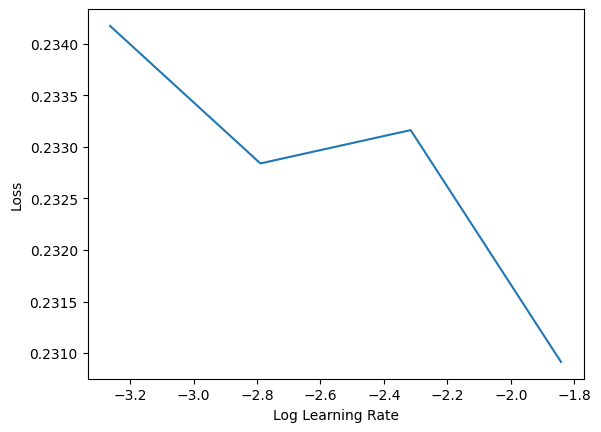

In [27]:
# TODO: cercare pytorch lighning
train_dataset = CustomDataset(train_df, BATCH_SIZE)
train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, collate_fn=collate_fn, shuffle=True, drop_last=True)
loss = nn.L1Loss()
model = NeuralNetwork()
optimizer = torch.optim.SGD(model.parameters(), lr=0.001)

find_lr(model, train_dataloader, optimizer, loss)

## Training

  0%|          | 0/100 [00:00<?, ?epoch/s]

Epoch 01/100 | Train Loss 0.107 | Val Loss 0.083
	Saving model (improve loss) 1000000.0 -> 0.08275347203016281
Epoch 02/100 | Train Loss 0.104 | Val Loss 0.076
	Saving model (improve loss) 0.08275347203016281 -> 0.07640418410301208
Epoch 03/100 | Train Loss 0.146 | Val Loss 0.082
Epoch 04/100 | Train Loss 0.149 | Val Loss 0.080
Epoch 05/100 | Train Loss 0.117 | Val Loss 0.083
Epoch 06/100 | Train Loss 0.110 | Val Loss 0.075
	Saving model (improve loss) 0.07640418410301208 -> 0.07505227625370026
Epoch 07/100 | Train Loss 0.123 | Val Loss 0.078
Epoch 08/100 | Train Loss 0.116 | Val Loss 0.082
Epoch 09/100 | Train Loss 0.146 | Val Loss 0.085
Epoch 10/100 | Train Loss 0.134 | Val Loss 0.075
	Saving model (improve loss) 0.07505227625370026 -> 0.07488283514976501
Epoch 11/100 | Train Loss 0.121 | Val Loss 0.080
Epoch 12/100 | Train Loss 0.132 | Val Loss 0.070
	Saving model (improve loss) 0.07488283514976501 -> 0.07017780840396881
Epoch 13/100 | Train Loss 0.114 | Val Loss 0.069
	Saving model

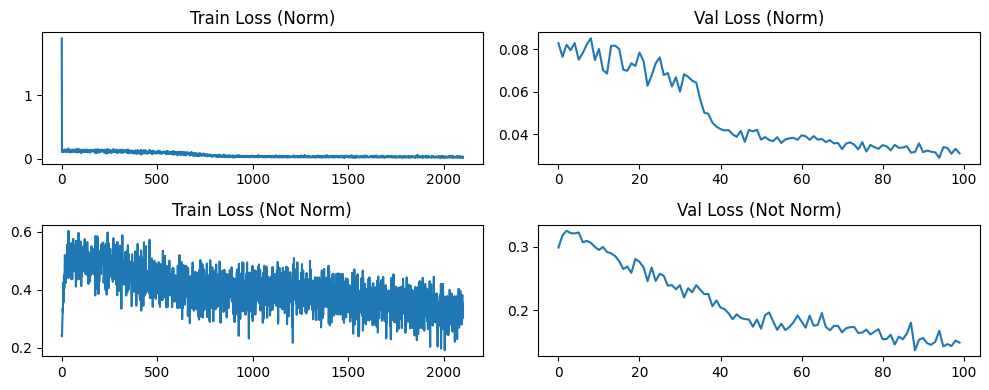

In [11]:
# definizione datasets e dataloaders
# vengono istanziati ogni volta che la run ha inizio così da gestire meglio ed impedire
# errori sul calcolo dei batch
train_dataset = CustomDataset(train_df, BATCH_SIZE)
train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, collate_fn=collate_fn, shuffle=True)
val_dataset = CustomDataset(val_df, BATCH_SIZE)
val_dataloader = DataLoader(val_dataset, batch_size=BATCH_SIZE, collate_fn=collate_fn, shuffle=True)

t_loss_list, t_loss_notnorm_list, v_loss_list, v_loss_notnorm_list = [], [], [], []
loop = tqdm(range(run.config['epochs']), unit="epoch")
early_stopping = EarlyStopper(patience=20)
best_vloss = 1_000_000.
loss = nn.L1Loss()

run.config['early_stopping'] = str(early_stopping)
run.config['save_best'] = True
run.watch(model)

for epoch in loop:
    model.train()
    for batch_idx, (before, target, future, after, m_b, b_t, m_a, timestamps, _) in enumerate(train_dataloader):        
        target, before, after, future = target.to(device), before.to(device), after.to(device), future.to(device)
        
        train_pred = model(before, after, future)
        train_loss = loss((train_pred/train_pred.sum(dim=(1,2), keepdim=True)) * target.sum(dim=(1,2), keepdim=True), target)
        
        optimizer.zero_grad()
        train_loss.backward()
        optimizer.step()
        
        t_loss_list.append(train_loss.item())

        with torch.no_grad(): # TODO: ricontrollare
            t_loss_notnorm_list.append(loss(train_pred, target).item())

    model.eval()
    running_vloss = 0.0
    running_vloss_notnorm = 0.0

    # Disable gradient computation and reduce memory consumption.
    with torch.no_grad():
        for i, (vbefore, vtarget, vfuture, vafter, vm_b, vm_t, vm_a, vtimestamp, _) in enumerate(val_dataloader):
            vbefore, vtarget, vfuture, vafter = vbefore.to(device), vtarget.to(device), vfuture.to(device), vafter.to(device)
            voutputs = model(vbefore, vafter, vfuture)
            #vloss = loss(voutputs, vtarget)
            # voutputs = (voutputs * vfuture[:,:,-1].reshape(voutputs.shape)) # output * isday
            vloss = loss((voutputs/voutputs.sum(dim=(1,2), keepdim=True)) * vtarget.sum(dim=(1,2), keepdim=True), vtarget)
            vloss_notnorm = loss(voutputs, vtarget)

            running_vloss += vloss
            running_vloss_notnorm += vloss_notnorm

    # resetting dataset generation
    # TODO: fix con DROP LAST
    train_dataset.reset()
    val_dataset.reset()
    
    avg_vloss = running_vloss / (i + 1) # TODO: ricontrollare
    avg_vloss_notnorm = running_vloss_notnorm / (i + 1) # TODO: ricontrollare

    v_loss_list.append(avg_vloss.item())
    v_loss_notnorm_list.append(avg_vloss_notnorm.item())
    
    loop.set_description(f"Epoch [{epoch}/{run.config['epochs']}]")
    loop.set_postfix(loss=t_loss_list[-1], val_loss=v_loss_list[-1])
    
    run.log({"loss": t_loss_list[-1], "val_loss": v_loss_list[-1]})
    
    print(
            f"Epoch {epoch+1:02d}/{run.config['epochs']:02d}"
            f" | Train Loss {t_loss_list[-1]:.3f}"
            f" | Val Loss {v_loss_list[-1]:.3f}"
        )
    
    # save model when improves loss
    if avg_vloss < best_vloss:
        print(f"\tSaving model (improve loss) {best_vloss} -> {avg_vloss}")
        best_vloss = avg_vloss
        model_path = f"./models/GRRUN15MINOM_b{run.config['batch_size']}_e{run.config['epochs']}.model"
        torch.save(model.state_dict(), model_path)

    # check for early stopping
    if early_stopping.early_stop(v_loss_list[-1]):
        print(f"\tEarly Stopping @ epoch {epoch} loss: {t_loss_list[-1]} val_loss: {v_loss_list[-1]}")
        break

# plot training/validation loss
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 4))
axes[0, 0].set_title("Train Loss (Norm)")
axes[0, 0].plot(t_loss_list)
axes[0, 1].set_title("Val Loss (Norm)")
axes[0, 1].plot(v_loss_list)
axes[1, 0].set_title("Train Loss (Not Norm)")
axes[1, 0].plot(t_loss_notnorm_list)
axes[1, 1].set_title("Val Loss (Not Norm)")
axes[1, 1].plot(v_loss_notnorm_list)
fig.tight_layout()

## Evaluation

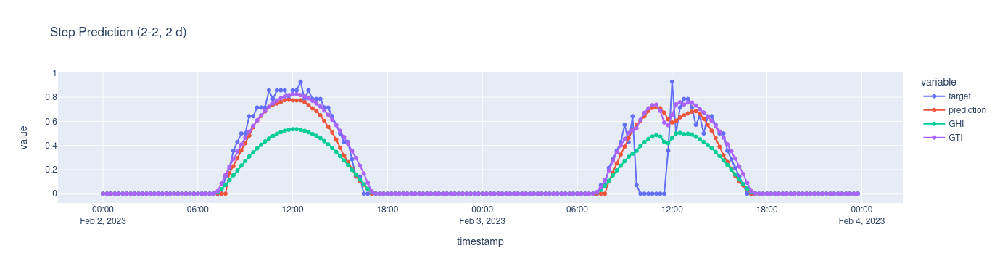

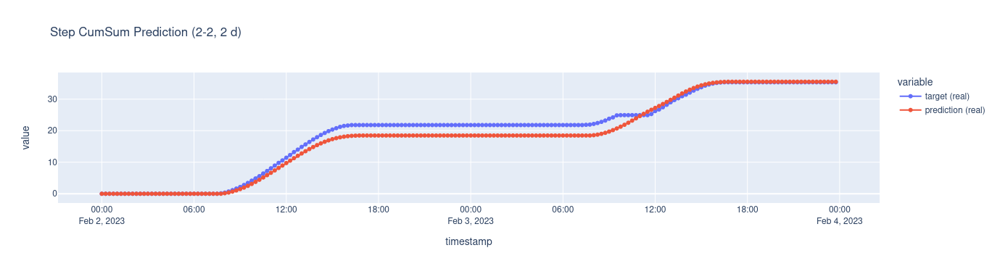

,Value
MAPE + (%),34.25
SMAPE (%),22.51
NRMSE (%),16.21
MAE (),0.06
R2,0.74
,Value ()
Day 1,1.78
Day 2,4.19
,Value
MAPE (%),10.28


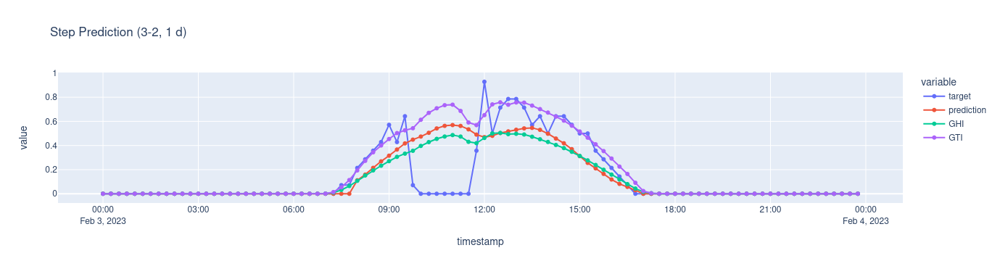

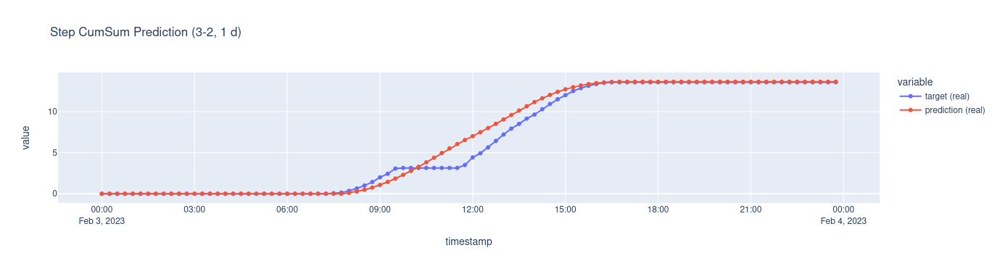

,Value
MAPE + (%),53.39
SMAPE (%),33.47
NRMSE (%),19.31
MAE (),0.09
R2,0.48
,Value ()
Day 1,8.52
,Value
MAPE (%),13.66
SMAPE (%),15.60


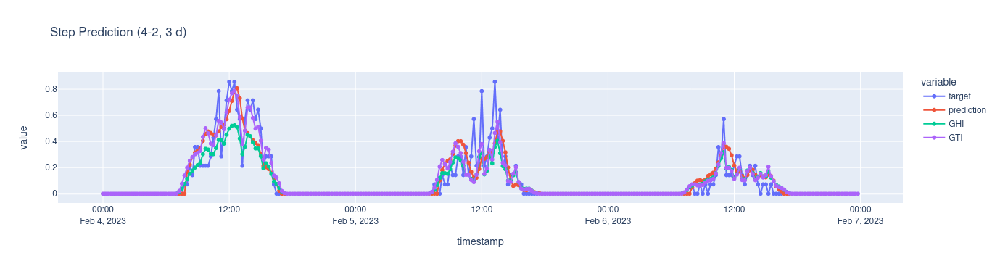

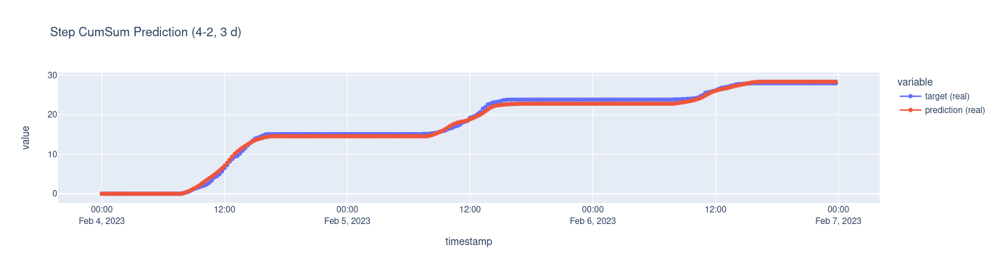

,Value
MAPE + (%),56.39
SMAPE (%),29.22
NRMSE (%),10.93
MAE (),0.04
R2,0.76
,Value ()
Day 1,1.75
Day 2,1.53
Day 3,0.93
,Value


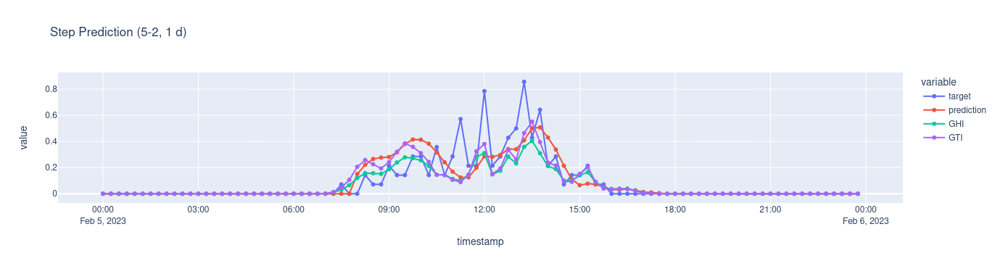

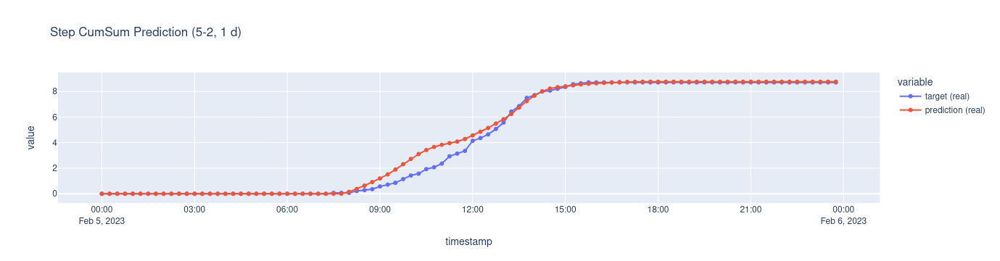

,Value
MAPE + (%),70.89
SMAPE (%),35.83
NRMSE (%),12.72
MAE (),0.05
R2,0.61
,Value ()
Day 1,4.80
,Value
MAPE (%),17.56
SMAPE (%),14.78


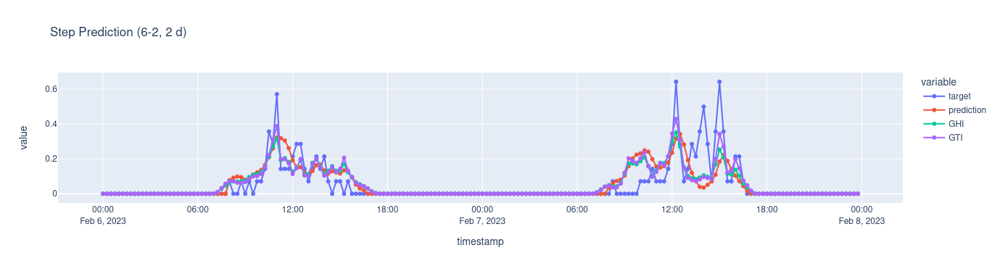

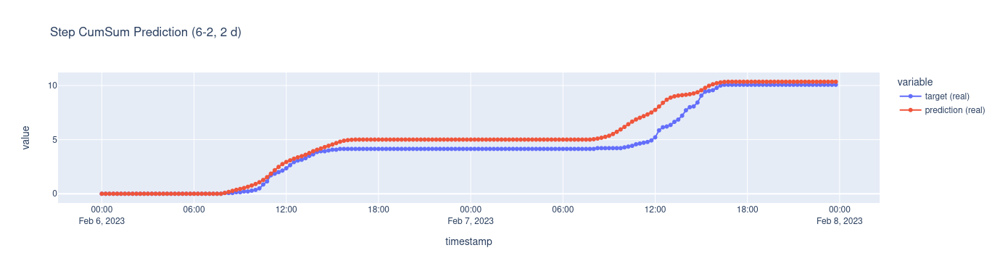

,Value
MAPE + (%),70.32
SMAPE (%),36.25
NRMSE (%),13.64
MAE (),0.04
R2,0.42
,Value ()
Day 1,1.31
Day 2,2.54
,Value
MAPE (%),22.61


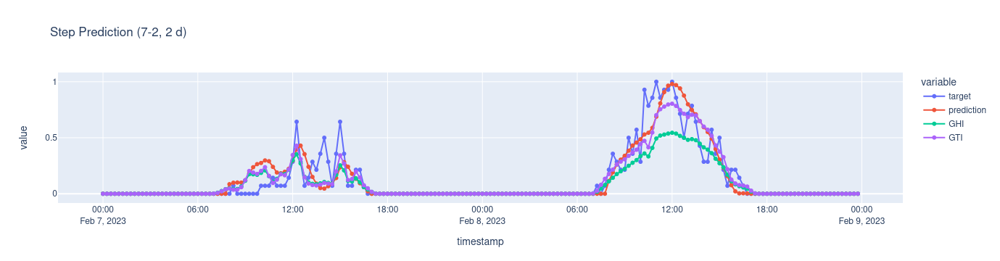

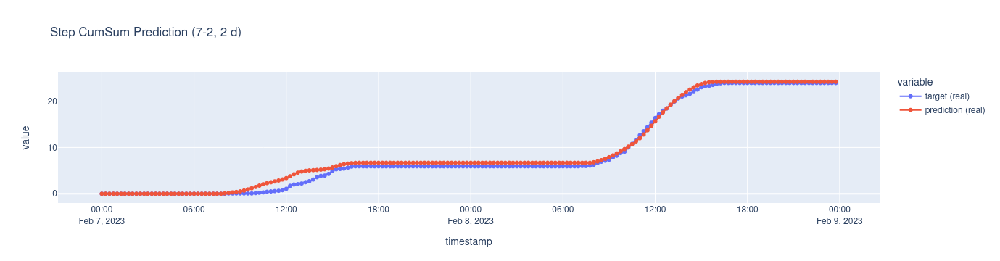

,Value
MAPE + (%),73.52
SMAPE (%),31.10
NRMSE (%),11.03
MAE (),0.06
R2,0.79
,Value ()
Day 1,2.77
Day 2,2.58
,Value
MAPE (%),38118.82


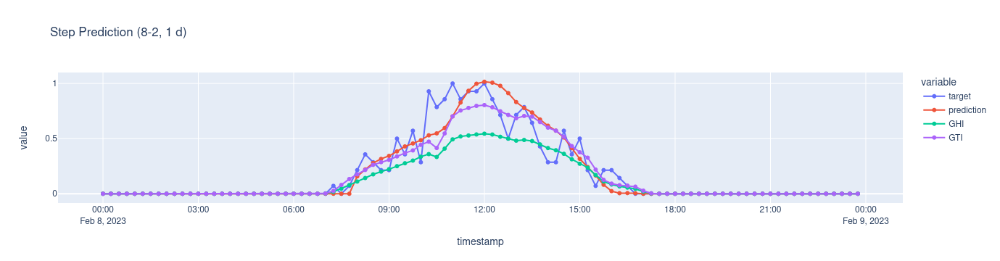

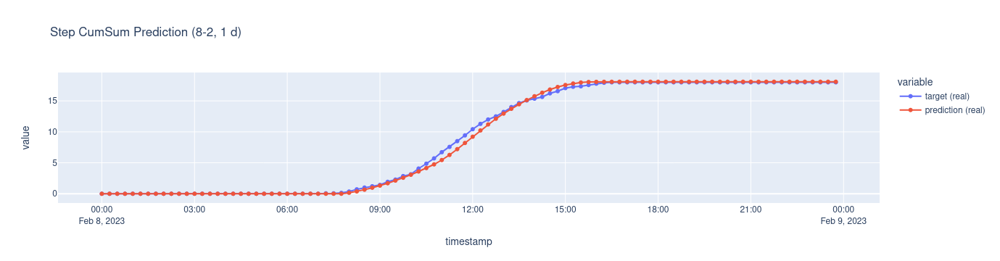

,Value
MAPE + (%),44.44
SMAPE (%),22.34
NRMSE (%),11.06
MAE (),0.05
R2,0.86
,Value ()
Day 1,5.26
,Value
MAPE (%),7.13
SMAPE (%),10.85


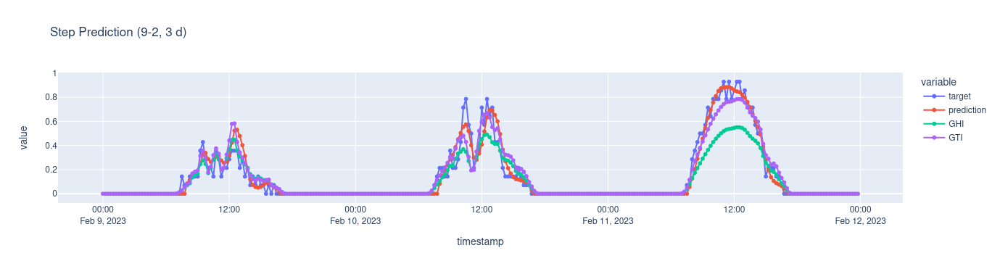

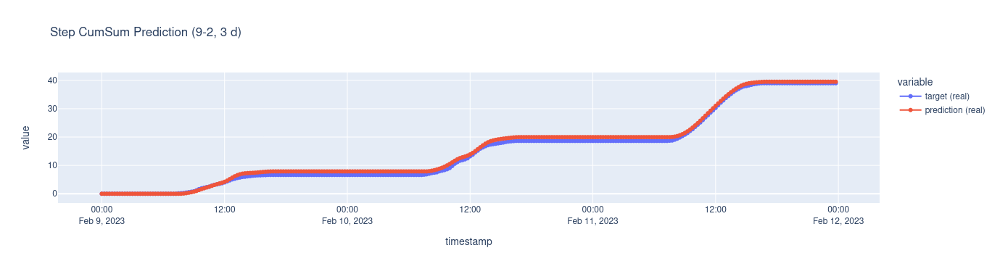

,Value
MAPE + (%),32.06
SMAPE (%),17.94
NRMSE (%),6.44
MAE (),0.03
R2,0.94
,Value ()
Day 1,0.89
Day 2,1.18
Day 3,0.77
,Value


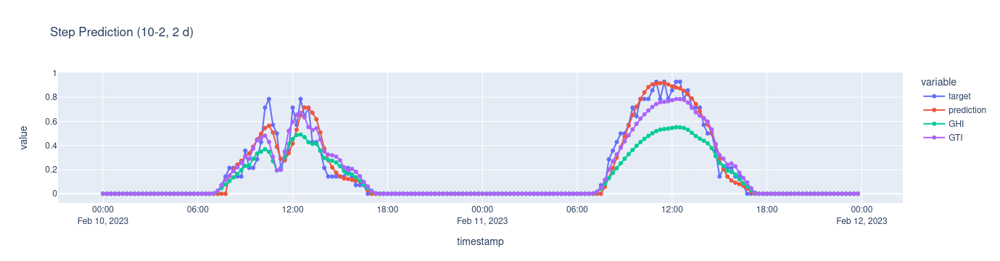

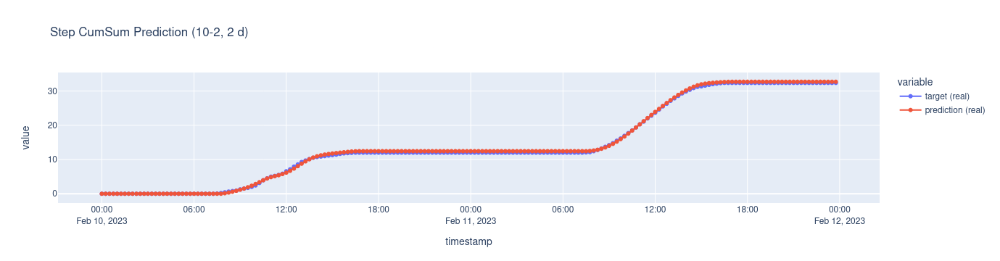

,Value
MAPE + (%),28.44
SMAPE (%),15.00
NRMSE (%),6.71
MAE (),0.03
R2,0.95
,Value ()
Day 1,1.77
Day 2,1.17
,Value
MAPE (%),4.05


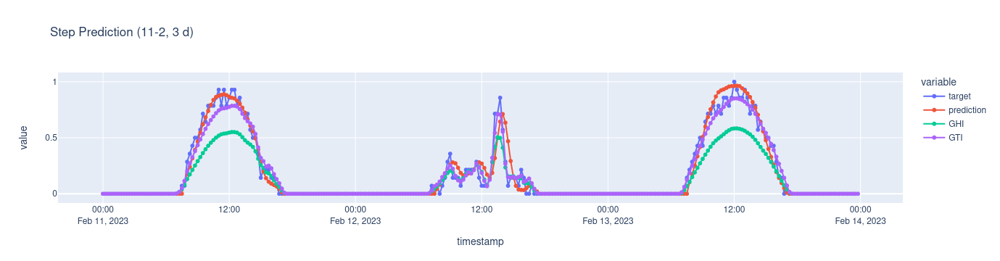

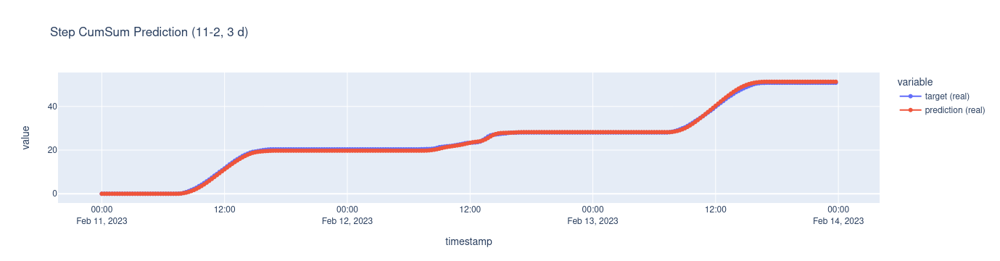

,Value
MAPE + (%),38.17
SMAPE (%),18.76
NRMSE (%),6.83
MAE (),0.03
R2,0.94
,Value ()
Day 1,0.73
Day 2,1.40
Day 3,1.03
,Value


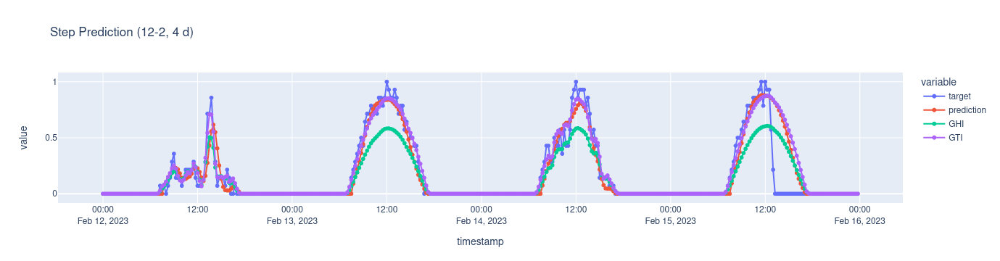

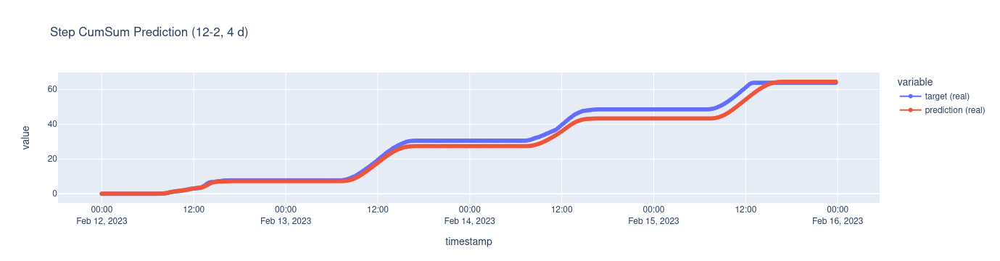

,Value
MAPE + (%),39.05
SMAPE (%),26.57
NRMSE (%),13.00
MAE (),0.06
R2,0.80
,Value ()
Day 1,1.02
Day 2,0.83
Day 3,1.04
Day 4,2.42


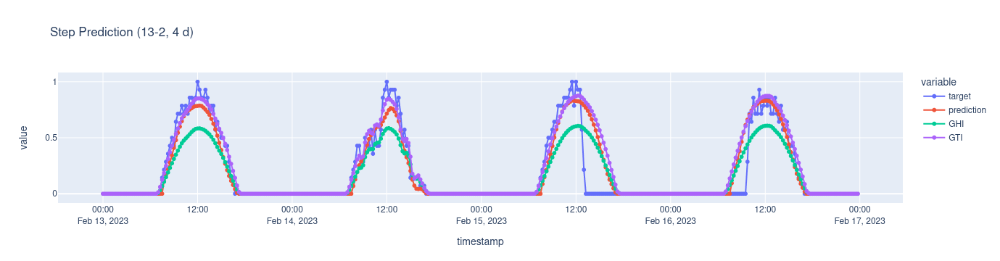

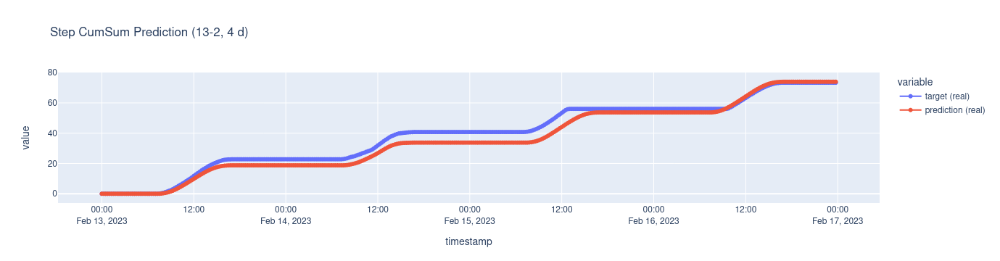

,Value
MAPE + (%),27.79
SMAPE (%),25.39
NRMSE (%),13.64
MAE (),0.06
R2,0.81
,Value ()
Day 1,1.04
Day 2,1.12
Day 3,2.45
Day 4,1.25


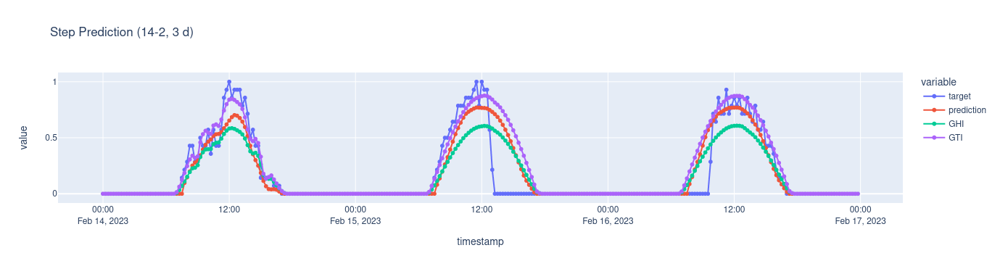

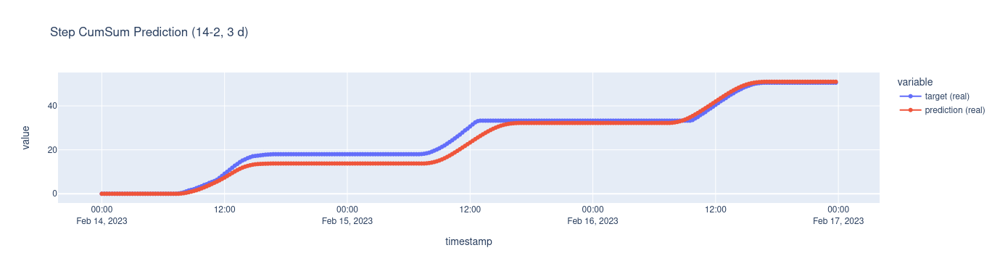

,Value
MAPE + (%),30.47
SMAPE (%),29.76
NRMSE (%),14.77
MAE (),0.07
R2,0.76
,Value ()
Day 1,1.68
Day 2,3.34
Day 3,1.61
,Value


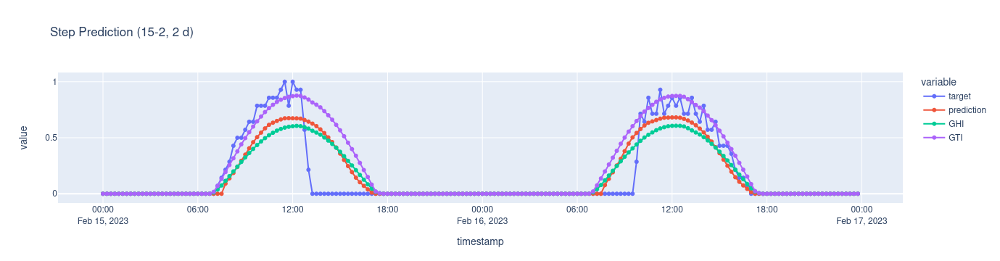

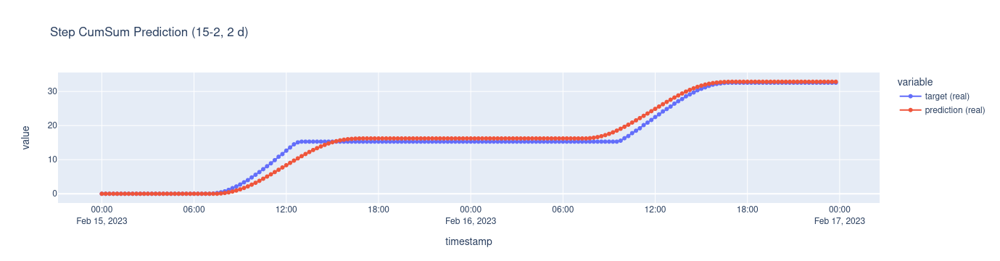

,Value
MAPE + (%),34.05
SMAPE (%),37.24
NRMSE (%),16.28
MAE (),0.08
R2,0.72
,Value ()
Day 1,5.24
Day 2,2.90
,Value
MAPE (%),10.56


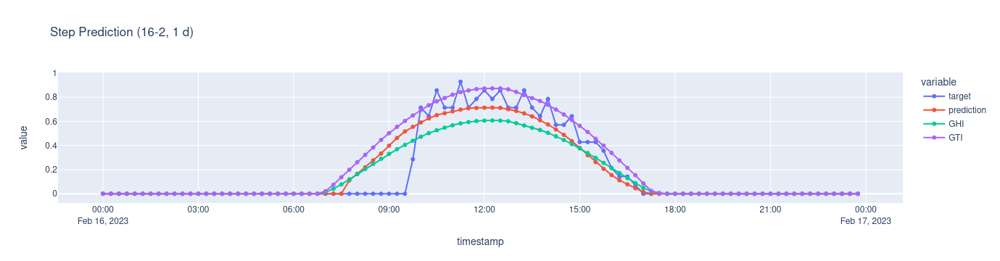

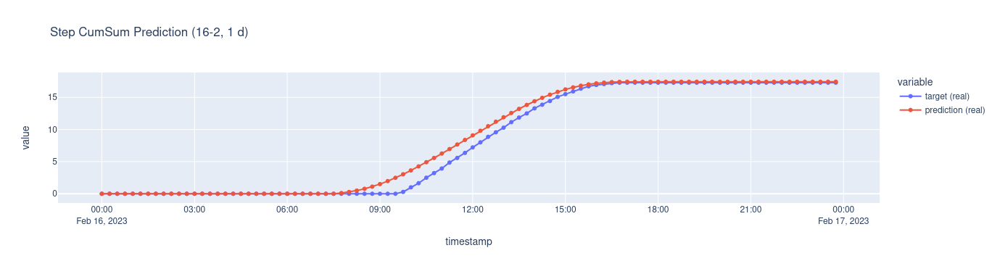

,Value
MAPE + (%),20.63
SMAPE (%),25.51
NRMSE (%),12.85
MAE (),0.06
R2,0.85
,Value ()
Day 1,5.39
,Value
MAPE (%),7754048.44
SMAPE (%),25.18


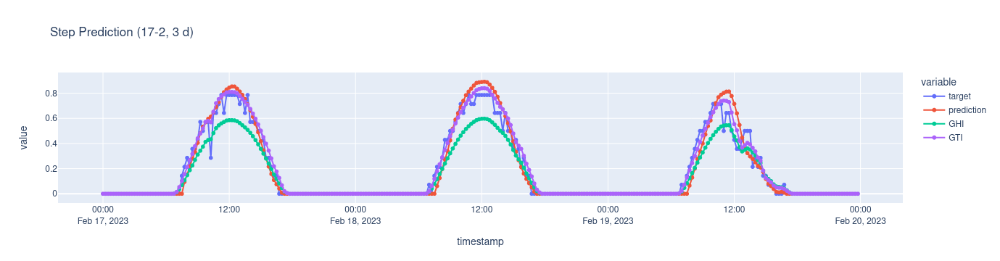

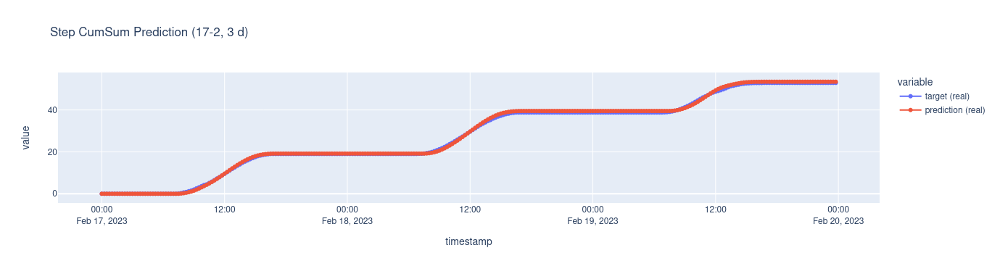

,Value
MAPE + (%),25.87
SMAPE (%),17.72
NRMSE (%),8.74
MAE (),0.03
R2,0.94
,Value ()
Day 1,0.81
Day 2,1.07
Day 3,1.39
,Value


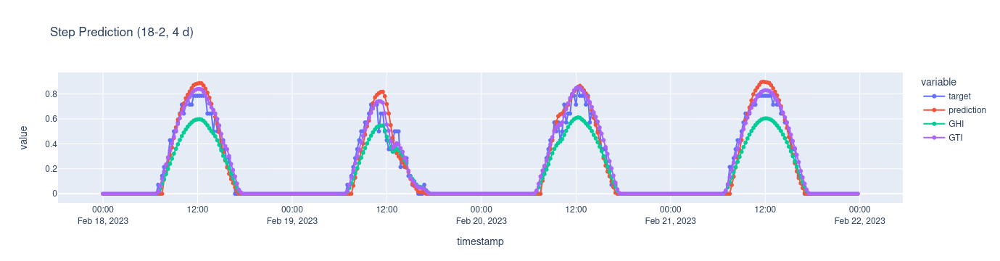

,Value
MAPE + (%),23.70
SMAPE (%),15.14
NRMSE (%),7.42
MAE (),0.03
R2,0.95
,Value ()
Day 1,0.72
Day 2,1.04
Day 3,0.61
Day 4,0.74


,Value
MAPE + (%),34.35
SMAPE (%),23.12
NRMSE (%),11.52
MAE (),0.04
R2,0.87
,Value ()
Day 1,3.83
,Value
MAPE (%),8.96
SMAPE (%),13.52


,Value
MAPE + (%),18.45
SMAPE (%),10.32
NRMSE (%),6.14
MAE (),0.03
R2,0.97
,Value ()
Day 1,1.13
Day 2,1.52
,Value
MAPE (%),2.34


,Value
MAPE + (%),40.37
SMAPE (%),20.07
NRMSE (%),9.45
MAE (),0.04
R2,0.91
,Value ()
Day 1,0.91
Day 2,1.08
Day 3,0.95
Day 4,0.70


,Value
MAPE + (%),57.94
SMAPE (%),27.29
NRMSE (%),10.73
MAE (),0.04
R2,0.83
,Value ()
Day 1,2.09
Day 2,1.98
,Value
MAPE (%),24.59


,Value
MAPE + (%),24.85
SMAPE (%),16.91
NRMSE (%),8.11
MAE (),0.03
R2,0.95
,Value ()
Day 1,1.57
Day 2,1.50
,Value
MAPE (%),4.32


Mape Global:  tensor(0.4187)


In [7]:
%run ./Modules/Evaluation.ipynb
model.load_state_dict(torch.load('./models/GRRUN15MINOM_b10_e100.model'))
evaluate(model)